In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap
from moviepy.editor import ImageClip, concatenate_videoclips

In [91]:
df = pd.read_csv('datos-nidos-avispa-asiatica.csv')
df

,_id,AÑO,NUM_ACTUACION,FECHA ALTA,USUARIO_EU,USUARIO_CAS,MUNICIPIO,DIRECCION,ESPECIE,UBICACION,...,DIAMETRO,latitude GEO,longitude GEO,longitude,latitude,ESTADO_EU,ESTADO_CAS,FECHA CIERRE,AGENTE CIERRE_EU,AGENTE CIERRE_CAS
0,21298,2023,1,2023-01-01 00:00:00,UDALA,AYUNTAMIENTO,ERANDIO,Magdalena Errepidea 12DUP (48950),AVISPA ASIÃTICA,ARBOLADO,...,60,43.324063517376345,-2.957814037799835,503420,4796803,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN
1,21299,2023,2,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,MARURI-JATABE,Lugar Barrio Elortegi 3A (48112),AVISPA ASIÃTICA,ARBOLADO,...,30,43.38785891846142,-2.8556420914333813,511692,4803897,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN
2,21300,2023,3,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,SONDIKA,Aresti Bidea 52A (48150),AVISPA ASIÃTICA,ARBOLADO,...,25,43.28904444672988,-2.932426765079039,505481,4792915,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN
3,21301,2023,4,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,IURRETA,Arandia Auzoa 3 (48215),AVISPA ASIÃTICA,CONSTRUCCIÃN,...,60,43.17903342792354,-2.6495792537069485,528479,4780756,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN
4,21302,2023,5,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,GALDAKAO,Lugar Barrio Aperribai 59B (48960),AVISPA ASIÃTICA,ARBOLADO,...,20,43.24175282880898,-2.8676913324869147,510741,4787670,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-02 00:00:00,SUHILTZAILEAK,BOMBEROS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17969,14647,2017,2821,2018-02-01 00:00:00,GALDAKAOKO UDALA,AYUNTAMIENTO GALDAKAO,GALDAKAO,POLIGONO APERRIBAI (PUENTE VASCONIA),AVISPA ASIÃTICA,ARBOLADO,...,60,"43,24626358","-2,883689722","509442,3106","4788169,105",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN
17970,14648,2017,2817,2018-02-01 00:00:00,ARRANKUDIAGAKO UDALA,AYUNTAMIENTO ARRANKUDIAGA,ARRANKUDIAGA,ARRANCUDIAGA,AVISPA ASIÃTICA,CONSTRUCCIÃN,...,50,"43,15893051","-2,931457313","505572,3806","4778466,285",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN
17971,14649,2017,2817,2018-02-01 00:00:00,ARRANKUDIAGAKO UDALA,AYUNTAMIENTO ARRANKUDIAGA,ARRANKUDIAGA,ARRANCUDIAGA,AVISPA ASIÃTICA,CONSTRUCCIÃN,...,15,"43,15893051","-2,931457313","505572,3806","4778466,285",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN
17972,14650,2017,2822,2018-02-01 00:00:00,ZALLAKO UDALA,AYUNTAMIENTO ZALLA,ZALLA,BOLUMBURU,AVISPA ASIÃTICA,ARBOLADO,...,150,"43,20342213","-3,159281426","487060,1435","4783417,194",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN


In [92]:
longitud_geo = np.array(df['longitude GEO'])
latitude_geo = np.array(df['latitude GEO'])
latitud, longitud = [], []
for i in range(0, len(longitud_geo)):
    if type(latitude_geo[i]) == str:
        latitud.append(latitude_geo[i].replace(",", "."))
        longitud.append(longitud_geo[i].replace(",", "."))
    else:
        latitud.append(latitude_geo[i])
        longitud.append(longitud_geo[i])

In [93]:
df['NEW_LATITUD'] = latitud
df['NEW_LONGITUD'] = longitud

In [94]:
df

,_id,AÑO,NUM_ACTUACION,FECHA ALTA,USUARIO_EU,USUARIO_CAS,MUNICIPIO,DIRECCION,ESPECIE,UBICACION,...,longitude GEO,longitude,latitude,ESTADO_EU,ESTADO_CAS,FECHA CIERRE,AGENTE CIERRE_EU,AGENTE CIERRE_CAS,NEW_LATITUD,NEW_LONGITUD
0,21298,2023,1,2023-01-01 00:00:00,UDALA,AYUNTAMIENTO,ERANDIO,Magdalena Errepidea 12DUP (48950),AVISPA ASIÃTICA,ARBOLADO,...,-2.957814037799835,503420,4796803,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN,43.324063517376345,-2.957814037799835
1,21299,2023,2,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,MARURI-JATABE,Lugar Barrio Elortegi 3A (48112),AVISPA ASIÃTICA,ARBOLADO,...,-2.8556420914333813,511692,4803897,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN,43.38785891846142,-2.8556420914333813
2,21300,2023,3,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,SONDIKA,Aresti Bidea 52A (48150),AVISPA ASIÃTICA,ARBOLADO,...,-2.932426765079039,505481,4792915,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN,43.28904444672988,-2.932426765079039
3,21301,2023,4,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,IURRETA,Arandia Auzoa 3 (48215),AVISPA ASIÃTICA,CONSTRUCCIÃN,...,-2.6495792537069485,528479,4780756,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-05 00:00:00,BASALAN,BASALAN,43.17903342792354,-2.6495792537069485
4,21302,2023,5,2023-01-02 00:00:00,UDALA,AYUNTAMIENTO,GALDAKAO,Lugar Barrio Aperribai 59B (48960),AVISPA ASIÃTICA,ARBOLADO,...,-2.8676913324869147,510741,4787670,ITXITA - TALDEAK KENDU DU,CERRADA - ELIMINADO,2023-01-02 00:00:00,SUHILTZAILEAK,BOMBEROS,43.24175282880898,-2.8676913324869147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17969,14647,2017,2821,2018-02-01 00:00:00,GALDAKAOKO UDALA,AYUNTAMIENTO GALDAKAO,GALDAKAO,POLIGONO APERRIBAI (PUENTE VASCONIA),AVISPA ASIÃTICA,ARBOLADO,...,"-2,883689722","509442,3106","4788169,105",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN,43.24626358,-2.883689722
17970,14648,2017,2817,2018-02-01 00:00:00,ARRANKUDIAGAKO UDALA,AYUNTAMIENTO ARRANKUDIAGA,ARRANKUDIAGA,ARRANCUDIAGA,AVISPA ASIÃTICA,CONSTRUCCIÃN,...,"-2,931457313","505572,3806","4778466,285",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN,43.15893051,-2.931457313
17971,14649,2017,2817,2018-02-01 00:00:00,ARRANKUDIAGAKO UDALA,AYUNTAMIENTO ARRANKUDIAGA,ARRANKUDIAGA,ARRANCUDIAGA,AVISPA ASIÃTICA,CONSTRUCCIÃN,...,"-2,931457313","505572,3806","4778466,285",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN,43.15893051,-2.931457313
17972,14650,2017,2822,2018-02-01 00:00:00,ZALLAKO UDALA,AYUNTAMIENTO ZALLA,ZALLA,BOLUMBURU,AVISPA ASIÃTICA,ARBOLADO,...,"-3,159281426","487060,1435","4783417,194",TALDEAREN ZAIN,PENDIENTE DE GRUPO,NaN,BASALAN,BASALAN,43.20342213,-3.159281426


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17974 entries, 0 to 17973
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   _id                17974 non-null  int64 
 1   AÑO                17974 non-null  int64 
 2   NUM_ACTUACION      17974 non-null  int64 
 3   FECHA ALTA         17974 non-null  object
 4   USUARIO_EU         17974 non-null  object
 5   USUARIO_CAS        17974 non-null  object
 6   MUNICIPIO          17974 non-null  object
 7   DIRECCION          17974 non-null  object
 8   ESPECIE            17974 non-null  object
 9   UBICACION          17787 non-null  object
 10  ALTURA             17974 non-null  int64 
 11  DIAMETRO           17974 non-null  int64 
 12  latitude GEO       16872 non-null  object
 13  longitude GEO      16872 non-null  object
 14  longitude          16872 non-null  object
 15  latitude           16872 non-null  object
 16  ESTADO_EU          17974 non-null  objec

In [96]:
df.describe()

,_id,AÑO,NUM_ACTUACION,ALTURA,DIAMETRO
count,17974.000000,17974.000000,17974.000000,17974.000000,17974.000000
mean,10216.200234,2020.383721,1576.011962,8.404139,29.207411
std,7182.120211,1.843762,996.296527,11.023261,24.478491
min,1.000000,2017.000000,1.000000,0.000000,0.000000
25%,4494.250000,2019.000000,753.000000,2.000000,10.000000
50%,8987.500000,2020.000000,1502.000000,6.000000,25.000000
75%,13480.750000,2022.000000,2251.000000,12.000000,40.000000
max,24620.000000,2023.000000,4276.000000,255.000000,255.000000


In [97]:
df.columns

Index(['_id', 'AÑO', 'NUM_ACTUACION', 'FECHA ALTA', 'USUARIO_EU',
       'USUARIO_CAS', 'MUNICIPIO', 'DIRECCION', 'ESPECIE', 'UBICACION',
       'ALTURA', 'DIAMETRO', 'latitude GEO', 'longitude GEO', 'longitude',
       'latitude', 'ESTADO_EU', 'ESTADO_CAS', 'FECHA CIERRE',
       'AGENTE CIERRE_EU', 'AGENTE CIERRE_CAS', 'NEW_LATITUD', 'NEW_LONGITUD'],
      dtype='object')

In [98]:
print(df['AÑO'].unique())
print(df['ESPECIE'].unique())
print(df['UBICACION'].unique())
print(df['ALTURA'].unique())
print(df['DIAMETRO'].unique())

[2023 2019 2018 2021 2022 2020 2017]
['AVISPA ASIÃ\x81TICA' 'AVISPA COMÃ\x9aN' 'ABEJA' 'ELEVADA PELIGROSIDAD']
['ARBOLADO' 'CONSTRUCCIÃ\x93N' nan]
[ 15   8  10   3  30  20  12   5  18  14   7  25   6   2   9  36   4  40
  17   1  13  16 210  50 110  11  21 255 100  37 180 115  70  98 101  24
  44  23  45   0  35  80  26  28  19  22 150 200  38  66  34  32  29  60
 190  27 160 250  55 120  47  33  31]
[ 60  30  25  20  35  40  50  80   1   7   3   6   5  15  10 100   2   4
   8  12   9  11  17  62  49  22  70  13  48  27 150  21  23  75  45  29
  18  14  24  39  16 101  55  19  28  47  59  33  26  34  54  36  90 255
  32  57  42  85  64  38  65  66  72   0 120  37  43  46  31  99  58  56
  78  68  76  95  77 200  51  44  82  73  81  52 140  41 250  74  71 110
 125 115  53  79  61  89  67 254  96  69]


In [99]:
filter_df = df[['AÑO', 'ESPECIE', 'ALTURA', 'DIAMETRO', 'NEW_LATITUD', 'NEW_LONGITUD', 'ESTADO_CAS']]
filter_df.info()
sin_nan = filter_df.dropna()
sin_nan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17974 entries, 0 to 17973
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   AÑO           17974 non-null  int64 
 1   ESPECIE       17974 non-null  object
 2   ALTURA        17974 non-null  int64 
 3   DIAMETRO      17974 non-null  int64 
 4   NEW_LATITUD   16872 non-null  object
 5   NEW_LONGITUD  16872 non-null  object
 6   ESTADO_CAS    17974 non-null  object
dtypes: int64(3), object(4)
memory usage: 983.1+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 16872 entries, 0 to 17973
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   AÑO           16872 non-null  int64 
 1   ESPECIE       16872 non-null  object
 2   ALTURA        16872 non-null  int64 
 3   DIAMETRO      16872 non-null  int64 
 4   NEW_LATITUD   16872 non-null  object
 5   NEW_LONGITUD  16872 non-null  object
 6   ESTADO_CAS    1687

In [100]:
df1 = sin_nan[sin_nan['ESPECIE'] == 'AVISPA ASIÃTICA']
print(df1)
df2 = df1[(df1['ESTADO_CAS'] == 'CERRADA - ELIMINADO') | (df1['ESTADO_CAS'] == 'CERRADA - NO ELIMINABLE')]
df2['ESTADO_CAS'].unique()

        AÑO           ESPECIE  ALTURA  DIAMETRO         NEW_LATITUD  \
0      2023  AVISPA ASIÃTICA      15        60  43.324063517376345   
1      2023  AVISPA ASIÃTICA       8        30   43.38785891846142   
2      2023  AVISPA ASIÃTICA      10        25   43.28904444672988   
3      2023  AVISPA ASIÃTICA       3        60   43.17903342792354   
4      2023  AVISPA ASIÃTICA      30        20   43.24175282880898   
...     ...               ...     ...       ...                 ...   
17969  2017  AVISPA ASIÃTICA      15        60         43.24626358   
17970  2017  AVISPA ASIÃTICA      15        50         43.15893051   
17971  2017  AVISPA ASIÃTICA       2        15         43.15893051   
17972  2017  AVISPA ASIÃTICA      15       150         43.20342213   
17973  2017  AVISPA ASIÃTICA      20        50         43.20342213   

              NEW_LONGITUD           ESTADO_CAS  
0       -2.957814037799835  CERRADA - ELIMINADO  
1      -2.8556420914333813  CERRADA - ELIMINADO

array(['CERRADA - ELIMINADO', 'CERRADA - NO ELIMINABLE'], dtype=object)

In [101]:
estado_caso = []
estado_cas = np.array(df1['ESTADO_CAS'])
for i in range(0, len(estado_cas)):
    if estado_cas[i] == 'CERRADA - ELIMINADO':
        estado_caso.append('SI')
    elif estado_cas[i] == 'CERRADA - NO ELIMINABLE':
        estado_caso.append('NO')
estado_caso = np.array(estado_caso)

In [102]:
df2['ELIMINADO'] = estado_caso

In [103]:
df2

,AÑO,ESPECIE,ALTURA,DIAMETRO,NEW_LATITUD,NEW_LONGITUD,ESTADO_CAS,ELIMINADO
0,2023,AVISPA ASIÃTICA,15,60,43.324063517376345,-2.957814037799835,CERRADA - ELIMINADO,SI
1,2023,AVISPA ASIÃTICA,8,30,43.38785891846142,-2.8556420914333813,CERRADA - ELIMINADO,SI
2,2023,AVISPA ASIÃTICA,10,25,43.28904444672988,-2.932426765079039,CERRADA - ELIMINADO,SI
3,2023,AVISPA ASIÃTICA,3,60,43.17903342792354,-2.6495792537069485,CERRADA - ELIMINADO,SI
4,2023,AVISPA ASIÃTICA,30,20,43.24175282880898,-2.8676913324869147,CERRADA - ELIMINADO,SI
...,...,...,...,...,...,...,...,...
17859,2018,AVISPA ASIÃTICA,20,30,43.21356529,-2.669181834,CERRADA - NO ELIMINABLE,NO
17861,2018,AVISPA ASIÃTICA,40,100,43.27883883,-2.979136573,CERRADA - NO ELIMINABLE,NO
17862,2018,AVISPA ASIÃTICA,7,30,43.27005776,-2.978088212,CERRADA - ELIMINADO,SI
17901,2017,AVISPA ASIÃTICA,12,50,43.01355526,-3.056857931,CERRADA - ELIMINADO,SI


In [104]:
df2.describe()

,AÑO,ALTURA,DIAMETRO
count,15182.000000,15182.000000,15182.000000
mean,2020.483797,8.559939,30.236135
std,1.815325,11.022302,24.139130
min,2017.000000,0.000000,0.000000
25%,2019.000000,2.000000,15.000000
50%,2020.000000,6.000000,30.000000
75%,2022.000000,12.000000,40.000000
max,2023.000000,255.000000,255.000000


In [105]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15182 entries, 0 to 17902
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   AÑO           15182 non-null  int64 
 1   ESPECIE       15182 non-null  object
 2   ALTURA        15182 non-null  int64 
 3   DIAMETRO      15182 non-null  int64 
 4   NEW_LATITUD   15182 non-null  object
 5   NEW_LONGITUD  15182 non-null  object
 6   ESTADO_CAS    15182 non-null  object
 7   ELIMINADO     15182 non-null  object
dtypes: int64(3), object(5)
memory usage: 1.0+ MB


In [106]:
ano = np.array(df2['AÑO'])
especie = np.array(df2['ESPECIE'])
altura = np.array(df2['ALTURA'])
diametro = np.array(df2['DIAMETRO'])
latitude_geo = np.array(df2['NEW_LATITUD'])
longitud_geo = np.array(df2['NEW_LONGITUD'])
estado_cas = np.array(df2['ESTADO_CAS'])
eliminado = np.array(df2['ELIMINADO'])

<Axes: xlabel='AÑO', ylabel='Count'>

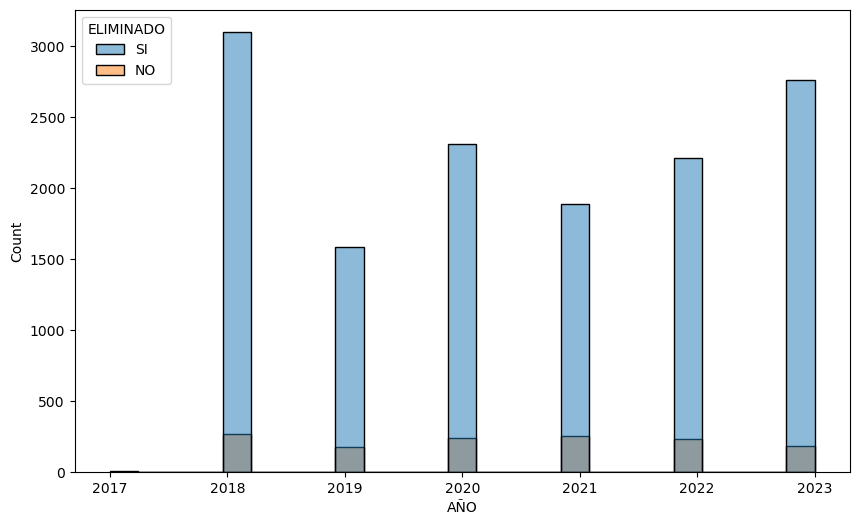

In [107]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df2, x=df2['AÑO'], hue=df2['ELIMINADO'])

<Axes: ylabel='Count'>

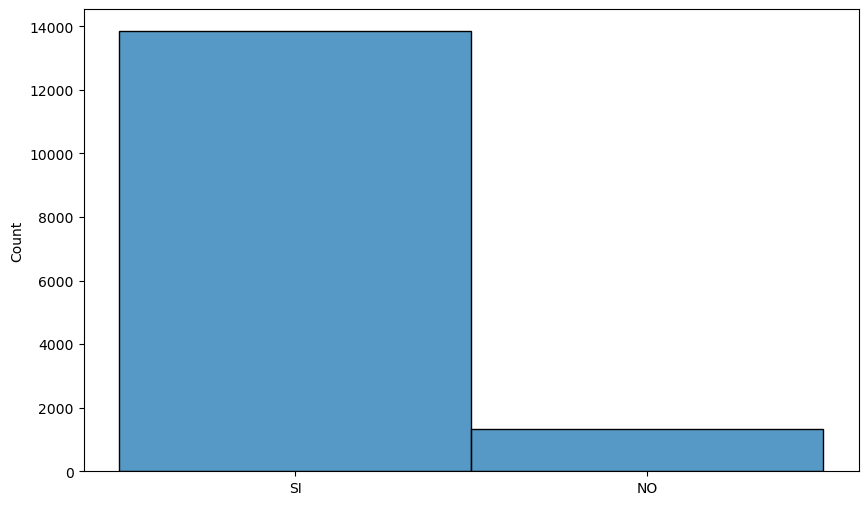

In [108]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df2, x=eliminado)

<Axes: ylabel='Count'>

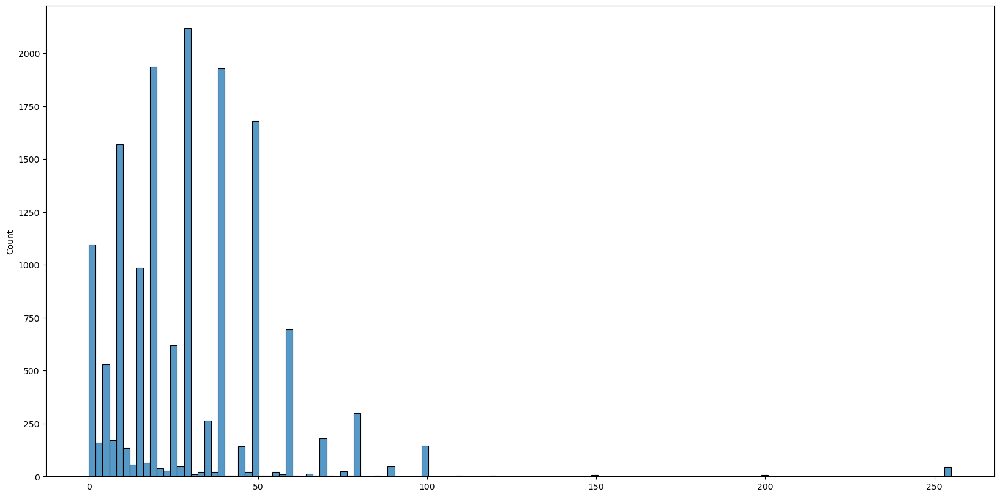

In [109]:
plt.figure(figsize=(20, 10))
sns.histplot(data=df2, x=diametro)

In [191]:
df_2017 = df2[df2['AÑO'] == 2017]
longitud_geo_2017 = np.array(df_2017['NEW_LONGITUD'], dtype=float)
latitude_geo_2017 = np.array(df_2017['NEW_LATITUD'], dtype=float)
diametro_2017 = np.array(df_2017['DIAMETRO'])
eliminado_2017 = np.array(df_2017['ELIMINADO'])
longitud_2017_si, longitud_2017_no, latitud_2017_si, latitud_2017_no = [], [], [], []
diametro_2017_si, diametro_2017_no = [], []
for i in range(0, len(longitud_geo_2017)-1):
    if eliminado_2017[i] == 'SI':
        longitud_2017_si.append(longitud_geo_2017[i])
        latitud_2017_si.append(latitude_geo_2017[i])
        diametro_2017_si.append(diametro_2017[i])
    elif eliminado_2017[i] == 'NO':
        longitud_2017_no.append(longitud_geo_2017[i])
        latitud_2017_no.append(latitude_geo_2017[i])
        diametro_2017_no.append(diametro_2017[i])

[50 50]
[-3.05685793 -3.05685793]
[-3.056857931] []
[43.01355526] []


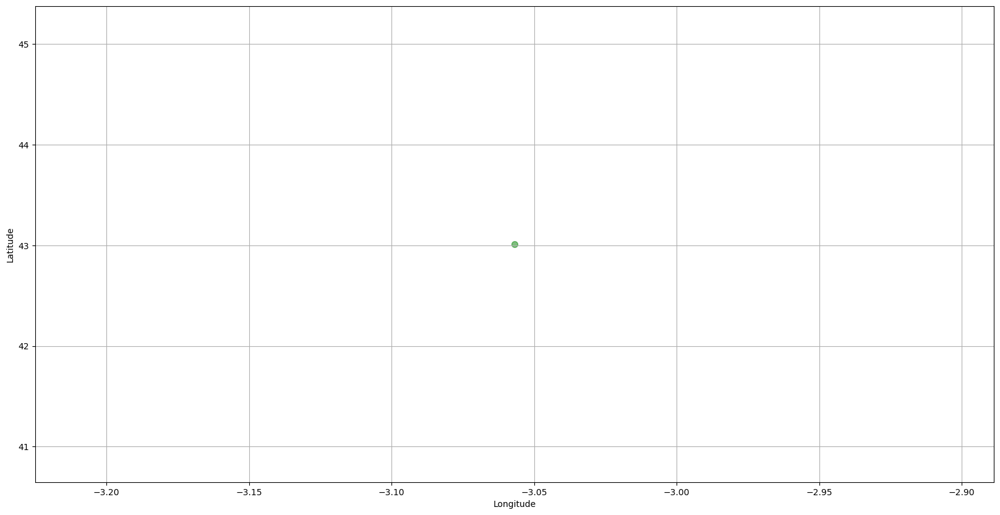

In [192]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2017_si, latitud_2017_si, color='green', s=diametro_2017_si, alpha=0.5)
plt.scatter(longitud_2017_no, latitud_2017_no, color='red', s=diametro_2017_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [112]:
df_2018 = df2[df2['AÑO'] == 2018]
longitud_geo_2018 = np.array(df_2018['NEW_LONGITUD'], dtype=float)
latitude_geo_2018 = np.array(df_2018['NEW_LATITUD'], dtype=float)

In [113]:
for i in range(0, len(longitud_geo_2018)):
    if longitud_geo_2018[i] > -2.25:
        print(longitud_geo_2018[i])
    elif longitud_geo_2018[i] < -3.5:
        print(longitud_geo_2018[i])

-3.676752772
-1.864677167


In [114]:
diametro_2018 = np.array(df_2018['DIAMETRO'])
eliminado_2018 = np.array(df_2018['ELIMINADO'])
longitud_2018_si, longitud_2018_no, latitud_2018_si, latitud_2018_no = [], [], [], []
diametro_2018_si, diametro_2018_no = [], []
for i in range(0, len(longitud_geo_2018)):
    if eliminado_2018[i] == 'SI':
        longitud_2018_si.append(longitud_geo_2018[i])
        latitud_2018_si.append(latitude_geo_2018[i])
        diametro_2018_si.append(diametro_2018[i])
    elif eliminado_2018[i] == 'NO':
        longitud_2018_no.append(longitud_geo_2018[i])
        latitud_2018_no.append(latitude_geo_2018[i])
        diametro_2018_no.append(diametro_2018[i])

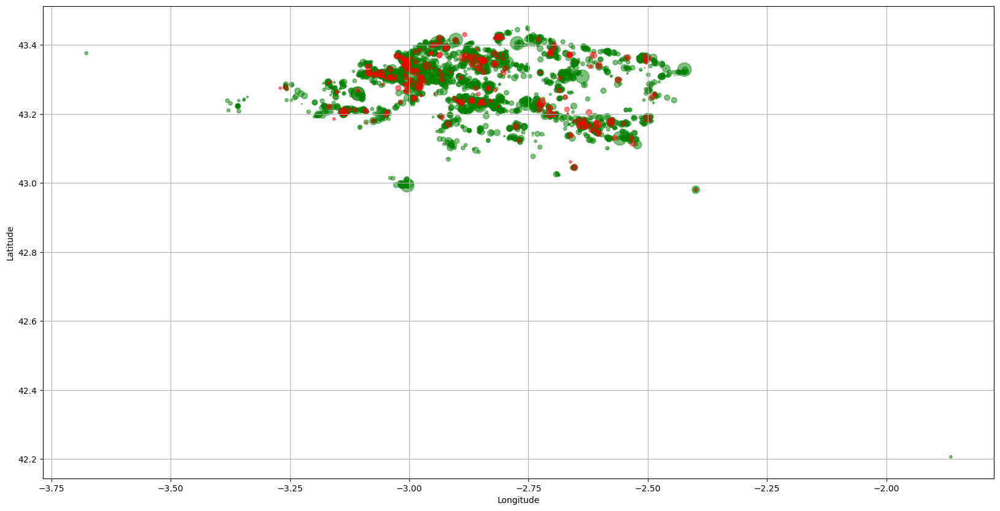

In [115]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2018_si, latitud_2018_si, color='green', s=diametro_2018_si, alpha=0.5)
plt.scatter(longitud_2018_no, latitud_2018_no, color='red', s=diametro_2018_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [116]:
df_2019 = df2[df2['AÑO'] == 2019]
longitud_geo_2019 = np.array(df_2019['NEW_LONGITUD'], dtype=float)
latitude_geo_2019 = np.array(df_2019['NEW_LATITUD'], dtype=float)
diametro_2019 = np.array(df_2019['DIAMETRO'])
eliminado_2019 = np.array(df_2019['ELIMINADO'])
longitud_2019_si, longitud_2019_no, latitud_2019_si, latitud_2019_no = [], [], [], []
diametro_2019_si, diametro_2019_no = [], []
for i in range(0, len(longitud_geo_2019)):
    if eliminado_2019[i] == 'SI':
        longitud_2019_si.append(longitud_geo_2019[i])
        latitud_2019_si.append(latitude_geo_2019[i])
        diametro_2019_si.append(diametro_2019[i])
    elif eliminado_2019[i] == 'NO':
        longitud_2019_no.append(longitud_geo_2019[i])
        latitud_2019_no.append(latitude_geo_2019[i])
        diametro_2019_no.append(diametro_2019[i])

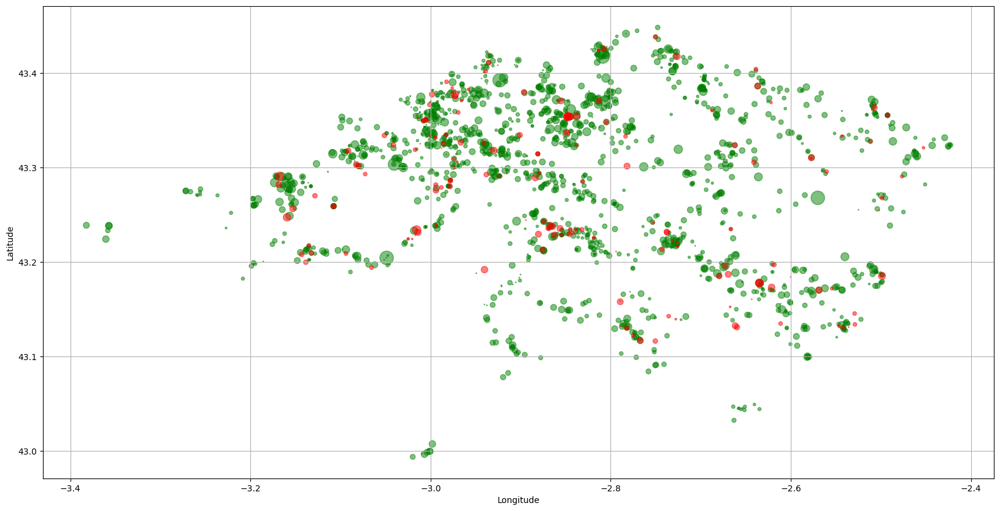

In [117]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2019_si, latitud_2019_si, color='green', s=diametro_2019_si, alpha=0.5)
plt.scatter(longitud_2019_no, latitud_2019_no, color='red', s=diametro_2019_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [118]:
df_2020 = df2[df2['AÑO'] == 2020]
longitud_geo_2020 = np.array(df_2020['NEW_LONGITUD'], dtype=float)
latitude_geo_2020 = np.array(df_2020['NEW_LATITUD'], dtype=float)
diametro_2020 = np.array(df_2020['DIAMETRO'])
eliminado_2020 = np.array(df_2020['ELIMINADO'])
longitud_2020_si, longitud_2020_no, latitud_2020_si, latitud_2020_no = [], [], [], []
diametro_2020_si, diametro_2020_no = [], []
for i in range(0, len(longitud_geo_2020)):
    if eliminado_2020[i] == 'SI':
        longitud_2020_si.append(longitud_geo_2020[i])
        latitud_2020_si.append(latitude_geo_2020[i])
        diametro_2020_si.append(diametro_2020[i])
    elif eliminado_2020[i] == 'NO':
        longitud_2020_no.append(longitud_geo_2020[i])
        latitud_2020_no.append(latitude_geo_2020[i])
        diametro_2020_no.append(diametro_2020[i])

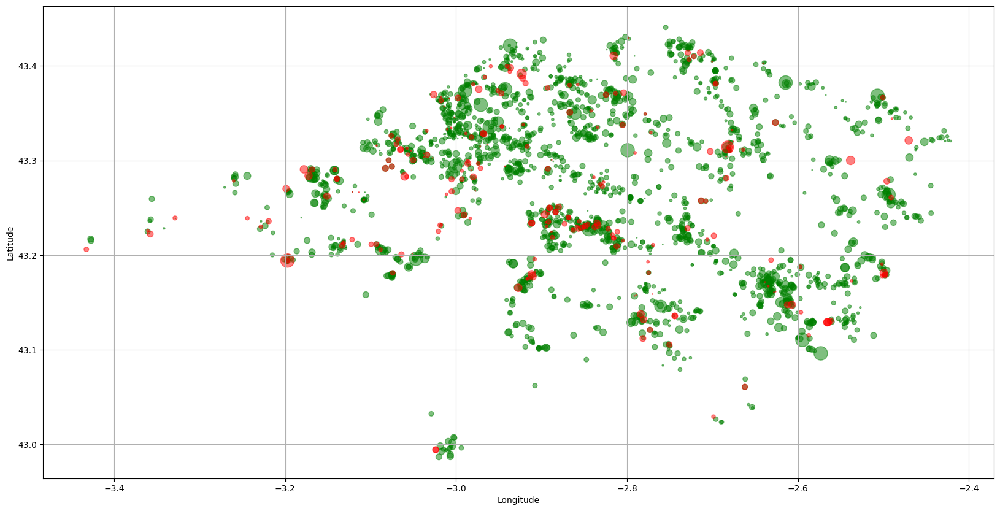

In [119]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2020_si, latitud_2020_si, color='green', s=diametro_2020_si, alpha=0.5)
plt.scatter(longitud_2020_no, latitud_2020_no, color='red', s=diametro_2020_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [120]:
df_2021 = df2[df2['AÑO'] == 2021]
longitud_geo_2021 = np.array(df_2021['NEW_LONGITUD'], dtype=float)
latitude_geo_2021 = np.array(df_2021['NEW_LATITUD'], dtype=float)
diametro_2021 = np.array(df_2021['DIAMETRO'])
eliminado_2021 = np.array(df_2021['ELIMINADO'])
longitud_2021_si, longitud_2021_no, latitud_2021_si, latitud_2021_no = [], [], [], []
diametro_2021_si, diametro_2021_no = [], []
for i in range(0, len(longitud_geo_2021)):
    if eliminado_2021[i] == 'SI':
        longitud_2021_si.append(longitud_geo_2021[i])
        latitud_2021_si.append(latitude_geo_2021[i])
        diametro_2021_si.append(diametro_2021[i])
    elif eliminado_2021[i] == 'NO':
        longitud_2021_no.append(longitud_geo_2021[i])
        latitud_2021_no.append(latitude_geo_2021[i])
        diametro_2021_no.append(diametro_2021[i])

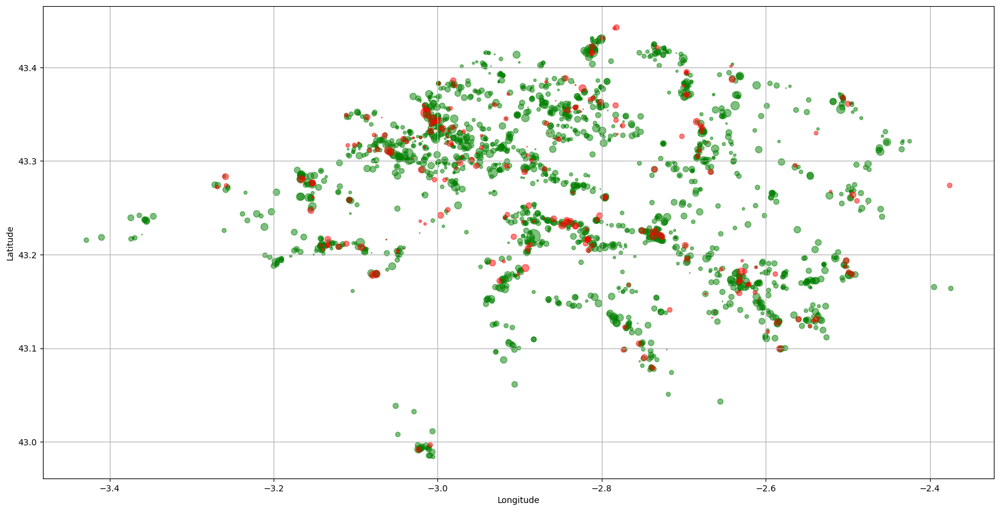

In [121]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2021_si, latitud_2021_si, color='green', s=diametro_2021_si, alpha=0.5)
plt.scatter(longitud_2021_no, latitud_2021_no, color='red', s=diametro_2021_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [122]:
df_2022 = df2[df2['AÑO'] == 2022]
longitud_geo_2022 = np.array(df_2022['NEW_LONGITUD'], dtype=float)
latitude_geo_2022 = np.array(df_2022['NEW_LATITUD'], dtype=float)

In [123]:
for i in range(0, len(longitud_geo_2022)):
    if longitud_geo_2022[i] == 2827414.0:
        longitud_geo_2022[i] = -2.827414
    elif longitud_geo_2022[i] == 278319.0:
        longitud_geo_2022[i] = -2.78319
    elif longitud_geo_2022[i] == 2507810.0:
        longitud_geo_2022[i] = -2.507810
    elif longitud_geo_2022[i] == 251267.0:
        longitud_geo_2022[i] = -2.51267
    elif longitud_geo_2022[i] == 2511525.0:
        longitud_geo_2022[i] = -2.511525
    elif longitud_geo_2022[i] == 276950.0:
        longitud_geo_2022[i] = -2.76950
    elif longitud_geo_2022[i] == 2943139259039370.0:
        longitud_geo_2022[i] = -2.943139259039370
    elif longitud_geo_2022[i] == 298262.0:
        longitud_geo_2022[i] = -2.98262
    elif longitud_geo_2022[i] == 2980.0:
        longitud_geo_2022[i] = -2.980
    elif longitud_geo_2022[i] == 2.9824072:
        longitud_geo_2022[i] = -2.9824072 

In [124]:
diametro_2022 = np.array(df_2022['DIAMETRO'])
eliminado_2022 = np.array(df_2022['ELIMINADO'])
longitud_2022_si, longitud_2022_no, latitud_2022_si, latitud_2022_no = [], [], [], []
diametro_2022_si, diametro_2022_no = [], []
for i in range(0, len(longitud_geo_2022)):
    if eliminado_2022[i] == 'SI':
        longitud_2022_si.append(longitud_geo_2022[i])
        latitud_2022_si.append(latitude_geo_2022[i])
        diametro_2022_si.append(diametro_2022[i])
    elif eliminado_2022[i] == 'NO':
        longitud_2022_no.append(longitud_geo_2022[i])
        latitud_2022_no.append(latitude_geo_2022[i])
        diametro_2022_no.append(diametro_2022[i])

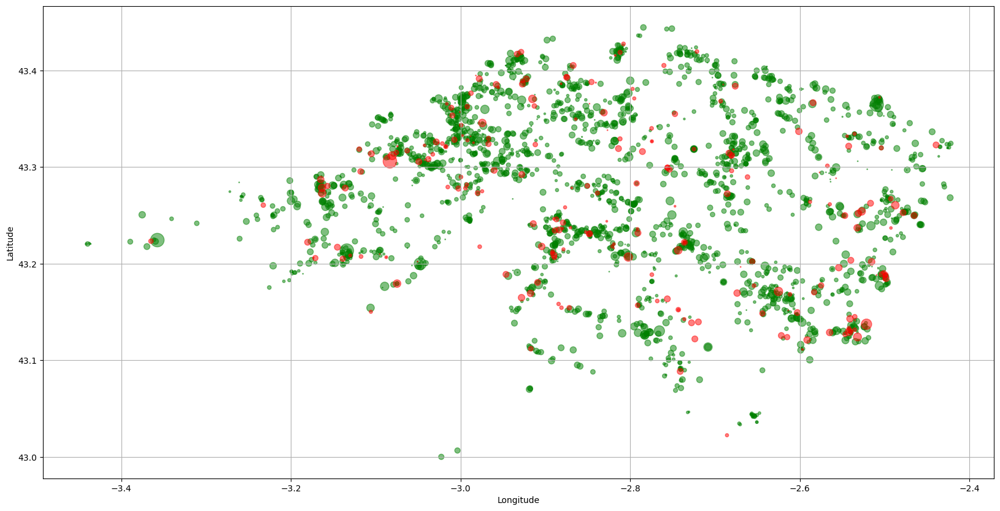

In [125]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2022_si, latitud_2022_si, color='green', s=diametro_2022_si, alpha=0.5)
plt.scatter(longitud_2022_no, latitud_2022_no, color='red', s=diametro_2022_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [126]:
df_2023 = df2[df2['AÑO'] == 2023]
longitud_geo_2023 = np.array(df_2023['NEW_LONGITUD'], dtype=float)
latitude_geo_2023 = np.array(df_2023['NEW_LATITUD'], dtype=float)

In [127]:
for i in range(0, len(longitud_geo_2023)):
    if longitud_geo_2023[i] == 0.0:
        longitud_geo_2023[i] = -2.68
    elif longitud_geo_2023[i] == 2.689919:
        longitud_geo_2023[i] = -2.689919
    elif longitud_geo_2023[i] == 2.7358048386242952:
        longitud_geo_2023[i] = -2.7358048386242952

In [128]:
for i in range(0, len(latitude_geo_2023)):
    if latitude_geo_2023[i] == 0.0:
        latitude_geo_2023[i]= 43.36

In [129]:
diametro_2023 = np.array(df_2023['DIAMETRO'])
eliminado_2023 = np.array(df_2023['ELIMINADO'])
longitud_2023_si, longitud_2023_no, latitud_2023_si, latitud_2023_no = [], [], [], []
diametro_2023_si, diametro_2023_no = [], []
for i in range(0, len(longitud_geo_2023)):
    if eliminado_2023[i] == 'SI':
        longitud_2023_si.append(longitud_geo_2023[i])
        latitud_2023_si.append(latitude_geo_2023[i])
        diametro_2023_si.append(diametro_2023[i])
    elif eliminado_2023[i] == 'NO':
        longitud_2023_no.append(longitud_geo_2023[i])
        latitud_2023_no.append(latitude_geo_2023[i])
        diametro_2023_no.append(diametro_2023[i])

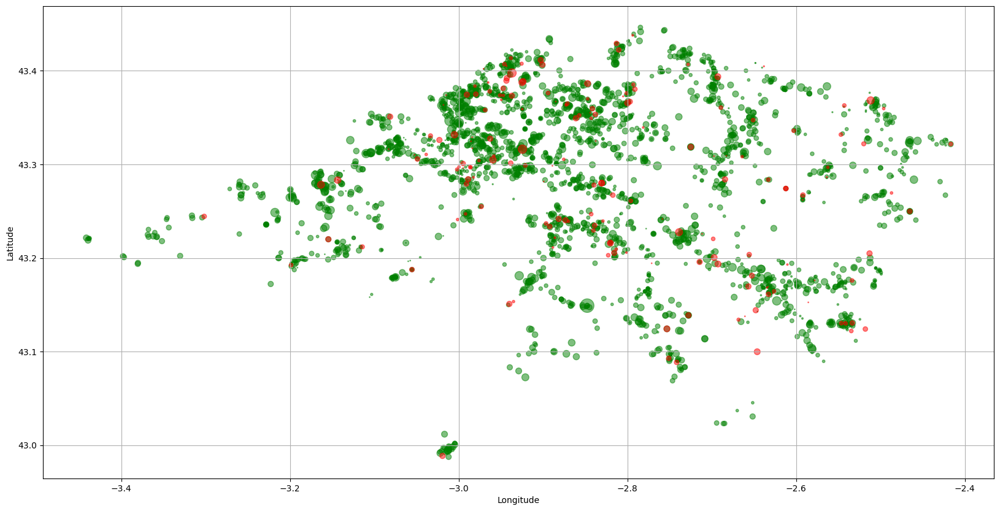

In [130]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2023_si, latitud_2023_si, color='green', s=diametro_2023_si, alpha=0.5)
plt.scatter(longitud_2023_no, latitud_2023_no, color='red', s=diametro_2023_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

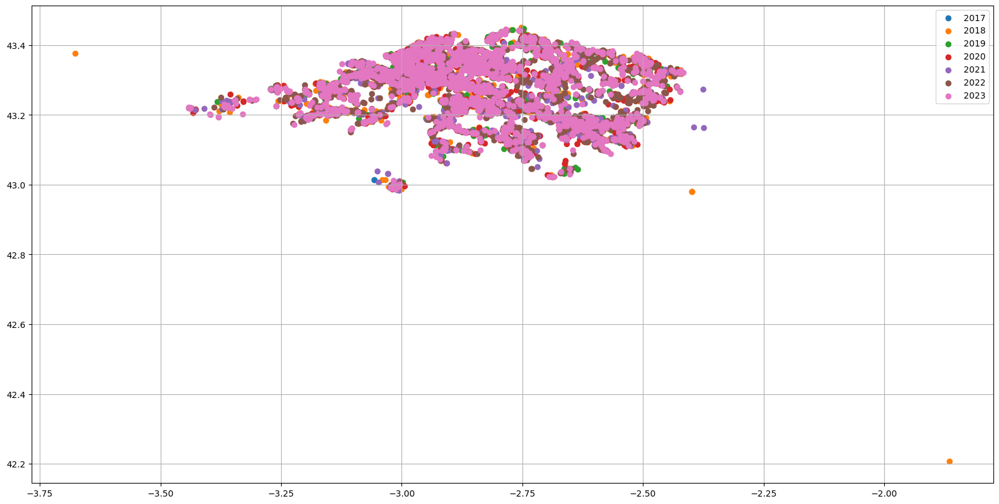

In [131]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_geo_2017, latitude_geo_2017, label='2017')
plt.scatter(longitud_geo_2018, latitude_geo_2018, label='2018')
plt.scatter(longitud_geo_2019, latitude_geo_2019, label='2019')
plt.scatter(longitud_geo_2020, latitude_geo_2020, label='2020')
plt.scatter(longitud_geo_2021, latitude_geo_2021, label='2021')
plt.scatter(longitud_geo_2022, latitude_geo_2022, label='2022')
plt.scatter(longitud_geo_2023, latitude_geo_2023, label='2023')
plt.grid()
plt.legend()
plt.show()

### Plots

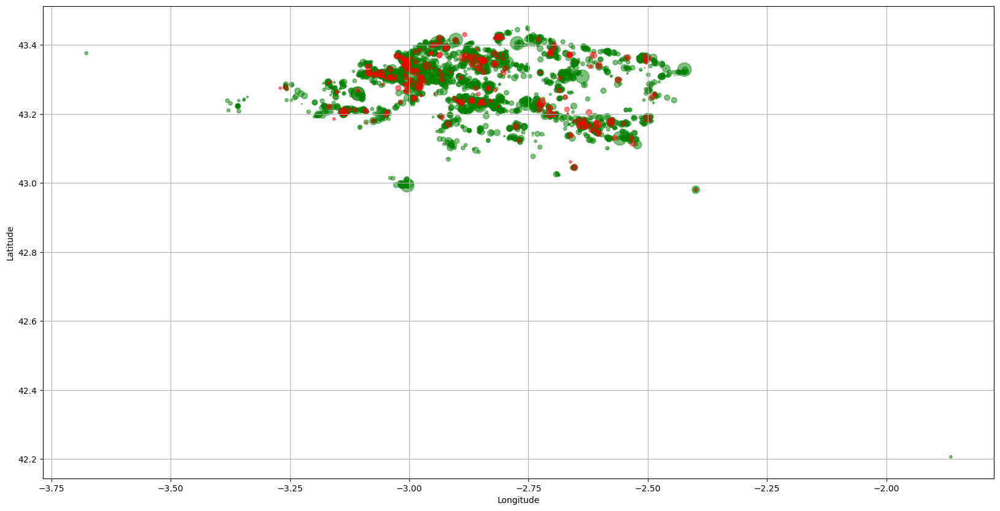

In [132]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2018_si, latitud_2018_si, color='green', s=diametro_2018_si, alpha=0.5)
plt.scatter(longitud_2018_no, latitud_2018_no, color='red', s=diametro_2018_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

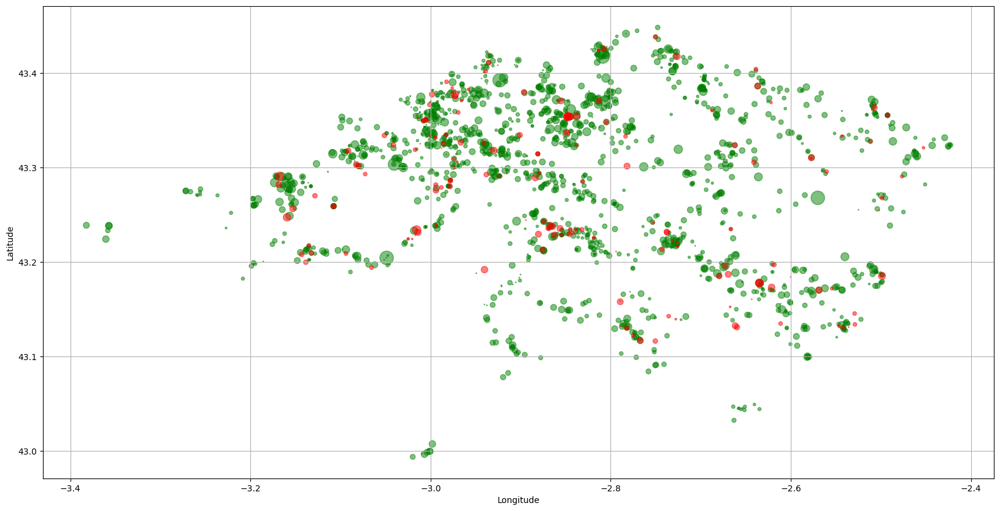

In [133]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2019_si, latitud_2019_si, color='green', s=diametro_2019_si, alpha=0.5)
plt.scatter(longitud_2019_no, latitud_2019_no, color='red', s=diametro_2019_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

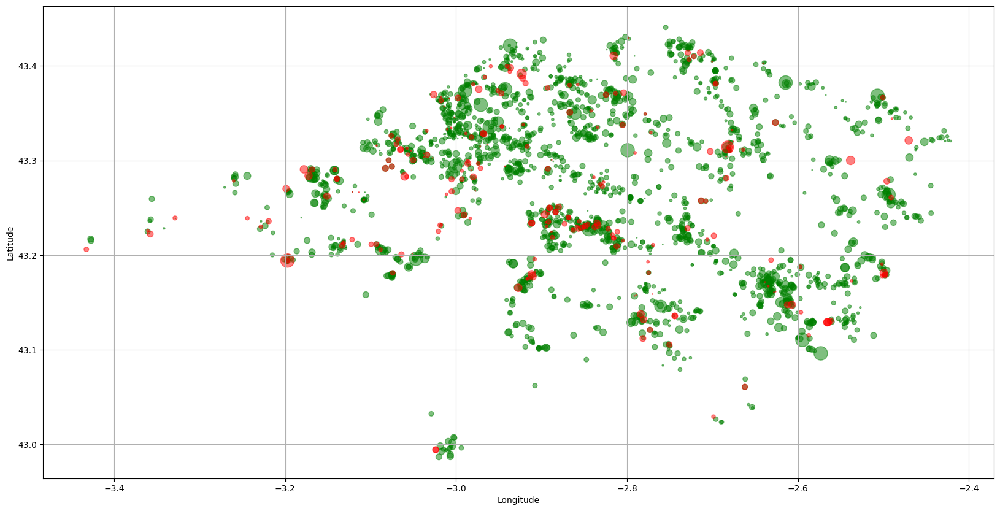

In [134]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2020_si, latitud_2020_si, color='green', s=diametro_2020_si, alpha=0.5)
plt.scatter(longitud_2020_no, latitud_2020_no, color='red', s=diametro_2020_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

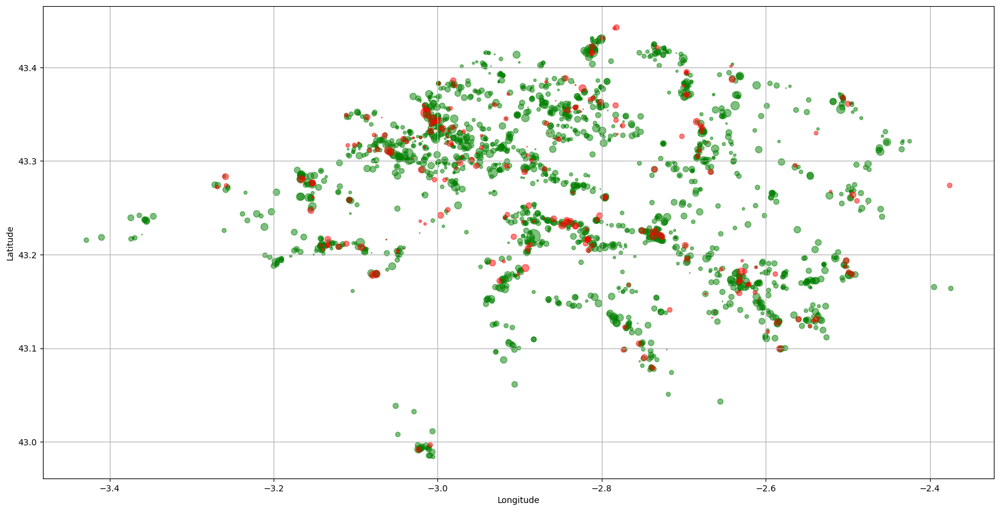

In [135]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2021_si, latitud_2021_si, color='green', s=diametro_2021_si, alpha=0.5)
plt.scatter(longitud_2021_no, latitud_2021_no, color='red', s=diametro_2021_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

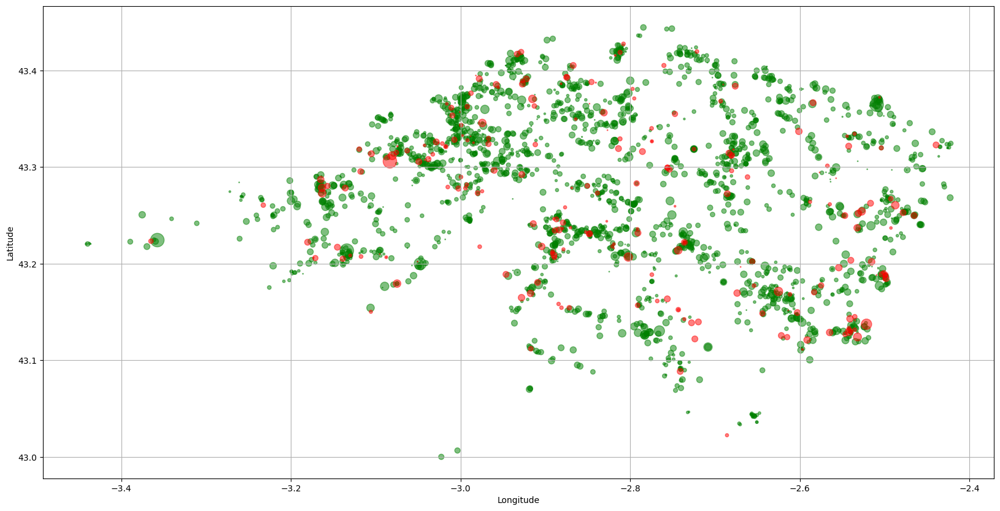

In [136]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2022_si, latitud_2022_si, color='green', s=diametro_2022_si, alpha=0.5)
plt.scatter(longitud_2022_no, latitud_2022_no, color='red', s=diametro_2022_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

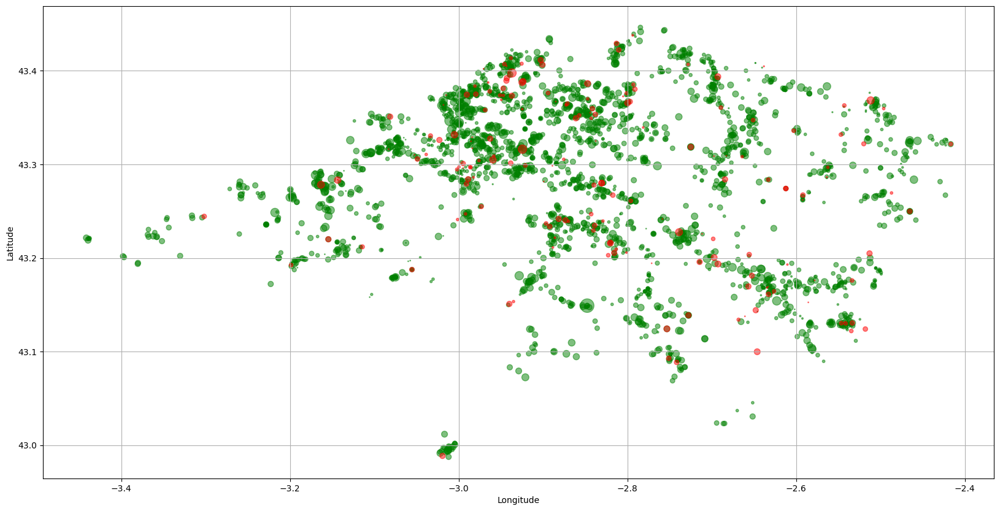

In [137]:
plt.figure(figsize=(20, 10))
plt.scatter(longitud_2023_si, latitud_2023_si, color='green', s=diametro_2023_si, alpha=0.5)
plt.scatter(longitud_2023_no, latitud_2023_no, color='red', s=diametro_2023_no, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()

In [138]:
x_min = -3.45
x_max = -2.35
y_min = 42.95
y_max =  43.5

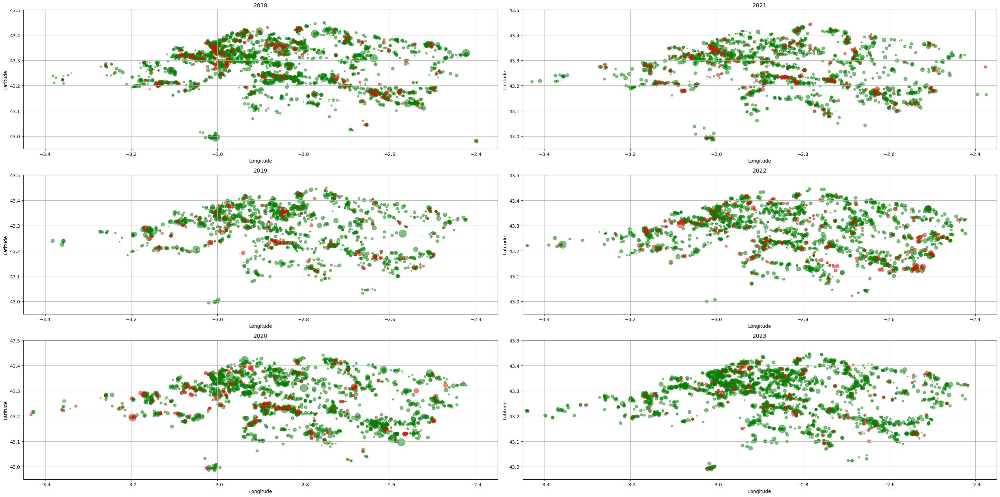

In [139]:
plt.figure(figsize=(30, 15))
plt.subplot(3, 2, 1)
plt.scatter(longitud_2018_si, latitud_2018_si, color='green', s=diametro_2018_si, alpha=0.5)
plt.scatter(longitud_2018_no, latitud_2018_no, color='red', s=diametro_2018_no, alpha=0.5)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()
plt.title('2018')

plt.subplot(3, 2, 3)
plt.scatter(longitud_2019_si, latitud_2019_si, color='green', s=diametro_2019_si, alpha=0.5)
plt.scatter(longitud_2019_no, latitud_2019_no, color='red', s=diametro_2019_no, alpha=0.5)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()
plt.title('2019')

plt.subplot(3, 2, 5)
plt.scatter(longitud_2020_si, latitud_2020_si, color='green', s=diametro_2020_si, alpha=0.5)
plt.scatter(longitud_2020_no, latitud_2020_no, color='red', s=diametro_2020_no, alpha=0.5)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()
plt.title('2020')

plt.subplot(3, 2, 2)
plt.scatter(longitud_2021_si, latitud_2021_si, color='green', s=diametro_2021_si, alpha=0.5)
plt.scatter(longitud_2021_no, latitud_2021_no, color='red', s=diametro_2021_no, alpha=0.5)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()
plt.title('2021')

plt.subplot(3, 2, 4)
plt.scatter(longitud_2022_si, latitud_2022_si, color='green', s=diametro_2022_si, alpha=0.5)
plt.scatter(longitud_2022_no, latitud_2022_no, color='red', s=diametro_2022_no, alpha=0.5)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()
plt.title('2022')

plt.subplot(3, 2, 6)
plt.scatter(longitud_2023_si, latitud_2023_si, color='green', s=diametro_2023_si, alpha=0.5)
plt.scatter(longitud_2023_no, latitud_2023_no, color='red', s=diametro_2023_no, alpha=0.5)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid()
plt.title('2023')

plt.tight_layout()
plt.show();

In [141]:
x_min_ini = -10
x_max_ini = 3
y_min_ini = 40
y_max_ini = 45
x_min = -3.45
x_max = -2.35
y_min = 42.95
y_max = 43.5
lon_0=(x_min + x_max) / 2 
lat_0=(y_min + y_max) / 2

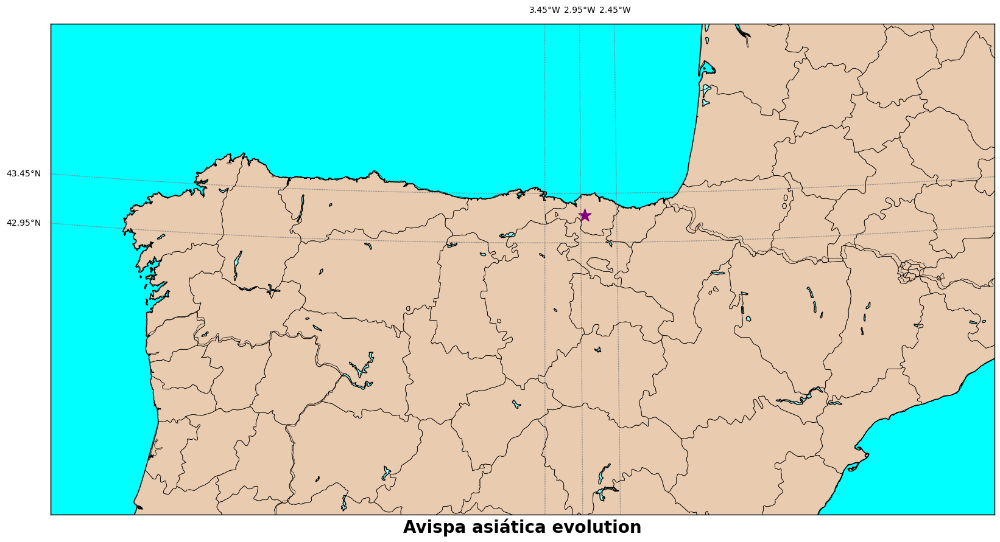

In [142]:
plt.figure(figsize=(20, 15))
ax = plt.gca()

m = Basemap(projection='lcc', lon_0=(x_min_ini + x_max_ini) / 2, lat_0=(y_min_ini + y_max_ini) / 2,
            llcrnrlat=y_min_ini, urcrnrlat=y_max_ini,
            llcrnrlon=x_min_ini, urcrnrlon=x_max_ini, resolution='f', ax=ax)

m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='aqua')
m.fillcontinents(color='#e9cbb0',lake_color='#99ffff')


m.drawmeridians(np.arange(x_min, x_max, 0.5), labels=[False, False, True, False], color='gray')
m.drawparallels(np.arange(y_min, y_max, 0.5), labels=[True, False, False, False], color='gray')

shapefile_path = '/home/mac/Documentos/CienciaDeDades/Visualitzacio_de_dades/Tema3/PAC3/ne_10m_admin_1_states_provinces'
m.readshapefile(shapefile_path, 'comunidades_autonomas', drawbounds=True)

m.scatter(lon_0, lat_0, latlon=True, color='purple', s=250, marker= '*')

plt.xlabel('Avispa asiática evolution', fontsize=20, fontweight='bold')

plt.show()

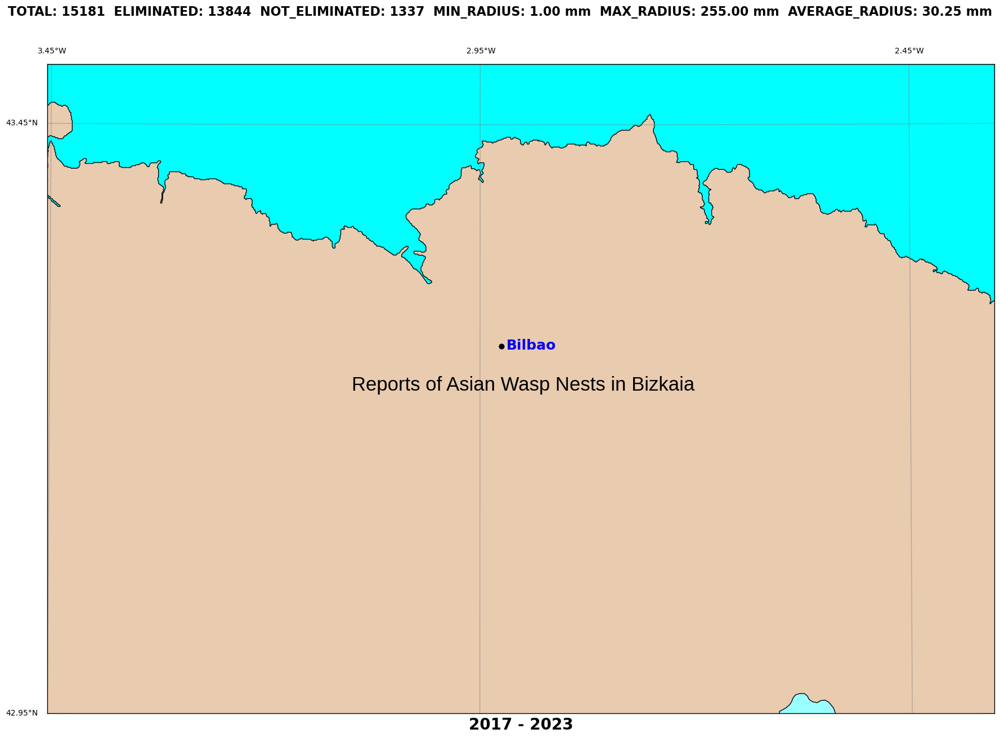

In [195]:
#Bilbao
lon = -2.92528
lat = 43.26271
plt.figure(figsize=(30, 15))
ax = plt.gca()
file = 'general.png'

m = Basemap(projection='lcc', lon_0=(x_min + x_max) / 2, lat_0=(y_min + y_max) / 2,
                llcrnrlat=y_min, urcrnrlat=y_max,
                llcrnrlon=x_min, urcrnrlon=x_max, resolution='f', ax=ax)

m.drawcoastlines()
m.drawmapboundary(fill_color='aqua')
m.fillcontinents(color='#e9cbb0',lake_color='#99ffff')

m.scatter(lon, lat, latlon=True, color='black', s=40)
x, y = m(lon+0.035, lat-0.003)
x1, y1 = m((x_min + x_max) / 2, (y_min + y_max) / 2)

ax.text(x, y, 'Bilbao', fontsize=18, fontweight='bold', ha='center', color='blue')
ax.text(x1, y1, "Reports of Asian Wasp Nests in Bizkaia", fontsize=25, fontweight='normal', ha='center', color='black', fontname='Liberation Sans')

m.drawmeridians(np.arange(x_min, x_max, 0.5), labels=[False, False, True, False], color='gray')
m.drawparallels(np.arange(y_min, y_max, 0.5), labels=[True, False, False, False], color='gray')


datos_combinados = np.concatenate([diametro_2017, diametro_2018, diametro_2019, diametro_2020, diametro_2021, diametro_2022, diametro_2023])
lon_si = np.concatenate([longitud_2017_si, longitud_2018_si, longitud_2019_si, longitud_2020_si, longitud_2021_si, longitud_2022_si, longitud_2023_si])
lon_no = np.concatenate([longitud_2017_no, longitud_2018_no, longitud_2019_no, longitud_2020_no, longitud_2021_no, longitud_2022_no, longitud_2023_no])
datos_combinados = datos_combinados[datos_combinados != 0.00]
avg = np.mean(datos_combinados)
min_value = np.min(datos_combinados)
max_value = np.max(datos_combinados)    

plt.suptitle(f'TOTAL: {len(lon_si)+len(lon_no)}  ELIMINATED: {len(lon_si)}  NOT_ELIMINATED: {len(lon_no)}  MIN_RADIUS: {min_value:.2f} mm  MAX_RADIUS: {max_value:.2f} mm  AVERAGE_RADIUS: {avg:.2f} mm',
                x=0.5, y=0.95, fontsize=16, fontweight='bold', ha='center')
plt.xlabel('2017 - 2023', fontsize=20, fontweight='bold')
plt.show()
plt.savefig(file)
plt.close()

In [217]:
def dibuja_mapa(lon_si, lon_no, lat_si, lat_no, s_si, s_no, x_min, x_max, y_min, y_max, file, title):
    
    plt.figure(figsize=(30, 15))
    ax = plt.gca()

    m = Basemap(projection='lcc', lon_0=(x_min + x_max) / 2, lat_0=(y_min + y_max) / 2,
                llcrnrlat=y_min, urcrnrlat=y_max,
                llcrnrlon=x_min, urcrnrlon=x_max, resolution='f', ax=ax)

    m.drawcoastlines()
    m.drawmapboundary(fill_color='aqua')
    m.fillcontinents(color='#e9cbb0',lake_color='#99ffff')

    m.scatter(lon_si, lat_si, latlon=True, color='green', s=s_si, alpha=0.5)
    m.scatter(lon_no, lat_no, latlon=True, color='red', s=s_no, alpha=0.5)

    m.drawmeridians(np.arange(x_min, x_max, 0.5), labels=[False, False, True, False], color='gray')
    m.drawparallels(np.arange(y_min, y_max, 0.5), labels=[True, False, False, False], color='gray')


    datos_combinados = np.concatenate((s_si, s_no))
    datos_combinados = datos_combinados[datos_combinados != 0.00]
    avg = np.mean(datos_combinados)
    min_value = np.min(datos_combinados)
    max_value = np.max(datos_combinados)
    plt.suptitle(f'TOTAL: {len(lon_si)+len(lon_no)}  ELIMINATED: {len(lon_si)}  NOT_ELIMINATED: {len(lon_no)}  MIN_RADIUS: {min_value:.2f} mm  MAX_RADIUS: {max_value:.2f} mm  AVERAGE_RADIUS: {avg:.2f} mm',
                x=0.5, y=0.95, fontsize=16, fontweight='bold', ha='center')
    plt.xlabel(title, fontsize=20, fontweight='bold')
    
    plt.scatter([], [], color='green', s= 1.0, label='small wasp eliminated')
    plt.scatter([], [], color='red', s= 1.0, label='small wasp not eliminated')
    plt.scatter([], [], color='green', s= 255.0, label='big wasp eliminated')
    plt.scatter([], [], color='red', s= 255.0, label='big wasp not eliminated')
    plt.legend(fontsize='x-large',scatterpoints=1)
    plt.savefig(file)
    plt.close()

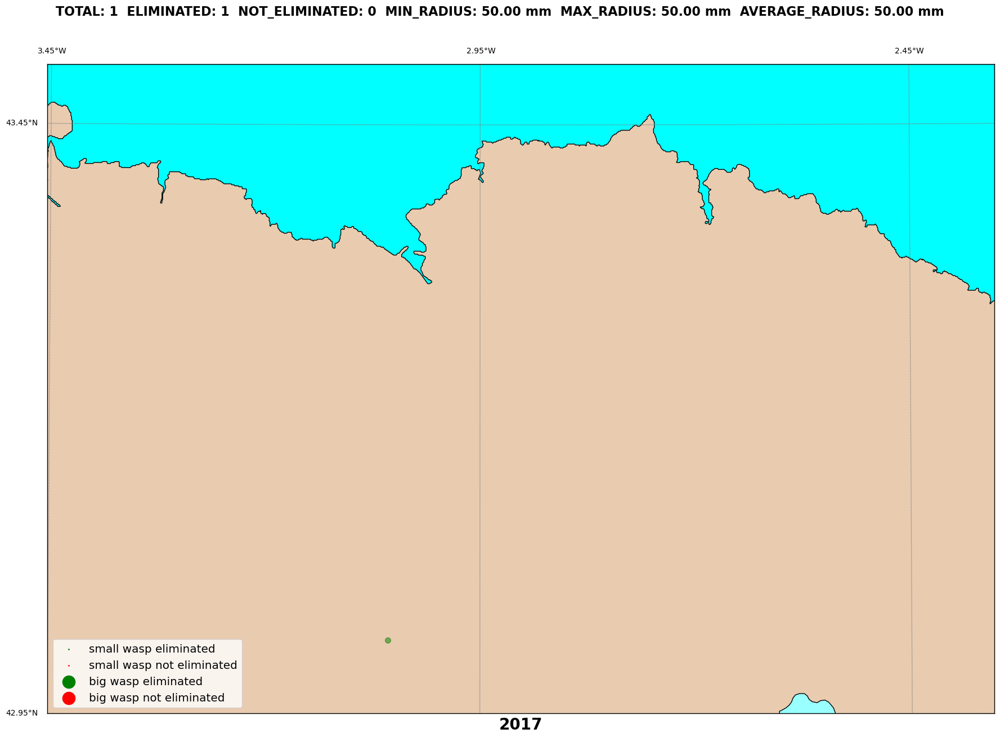

In [218]:
dibuja_mapa(longitud_2017_si, longitud_2017_no, latitud_2017_si, latitud_2017_no, diametro_2017_si, diametro_2017_no, x_min, x_max, y_min, y_max, '2017.png', '2017')

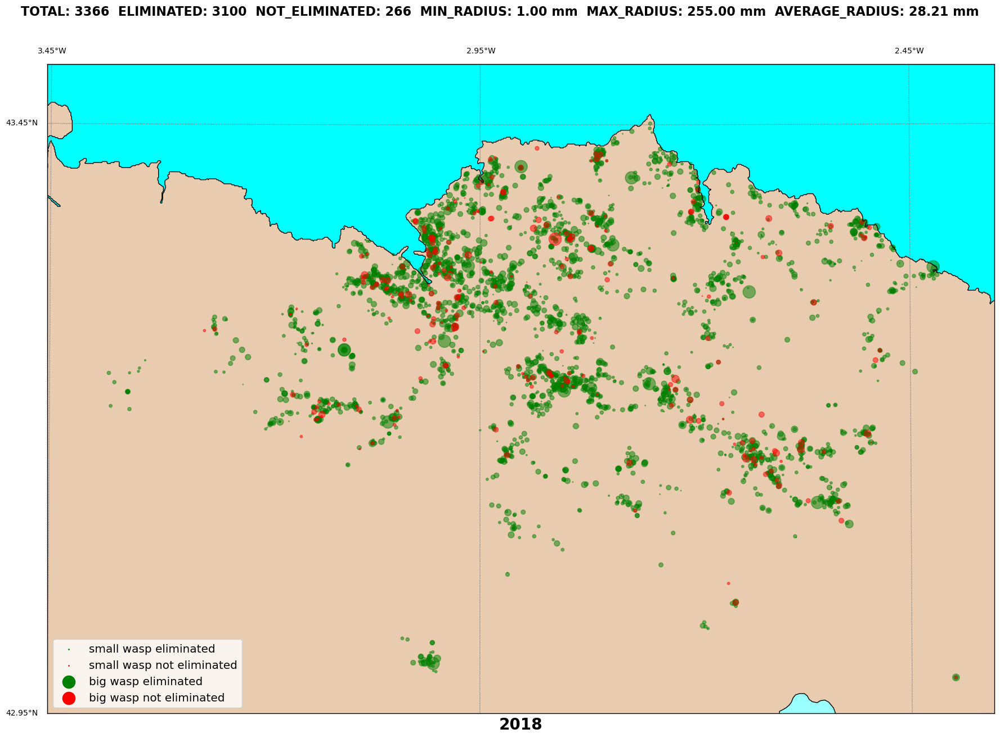

In [219]:
dibuja_mapa(longitud_2018_si, longitud_2018_no, latitud_2018_si, latitud_2018_no, diametro_2018_si, diametro_2018_no, x_min, x_max, y_min, y_max, '2018.png', '2018')

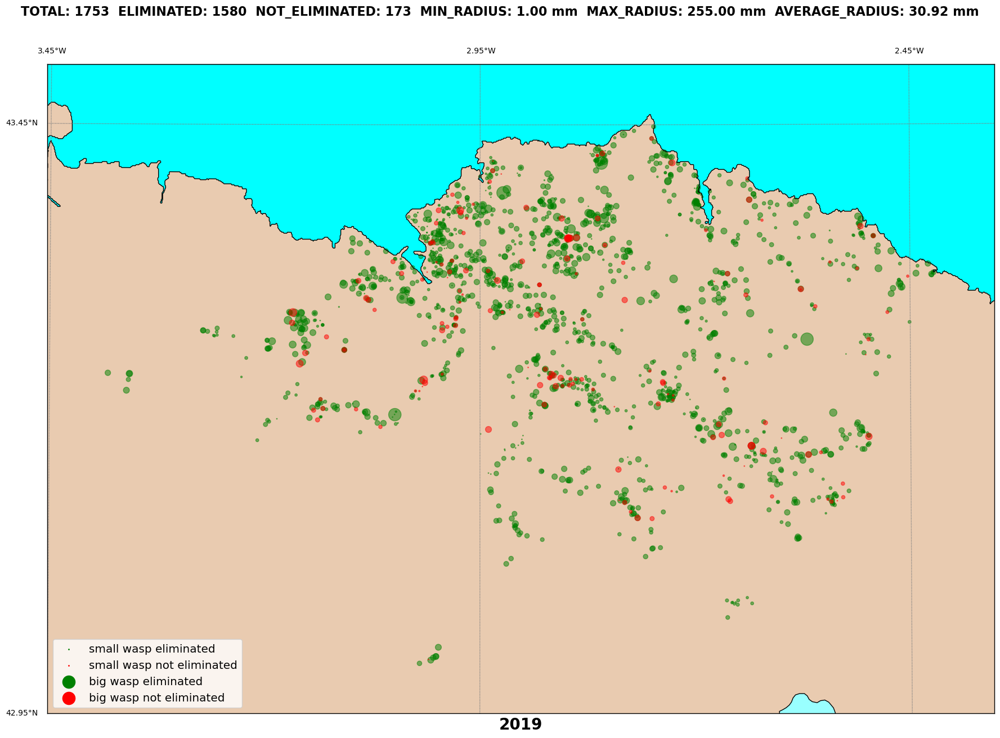

In [220]:
dibuja_mapa(longitud_2019_si, longitud_2019_no, latitud_2019_si, latitud_2019_no, diametro_2019_si, diametro_2019_no, x_min, x_max, y_min, y_max, '2019.png', '2019')

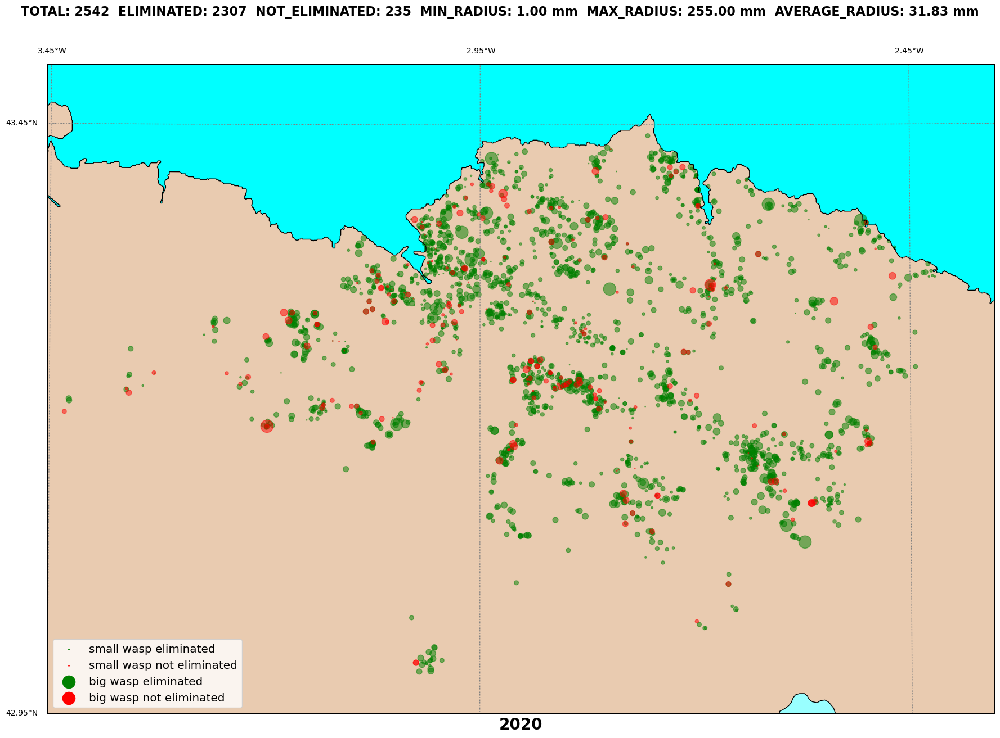

In [221]:
dibuja_mapa(longitud_2020_si, longitud_2020_no, latitud_2020_si, latitud_2020_no, diametro_2020_si, diametro_2020_no, x_min, x_max, y_min, y_max, '2020.png', '2020')

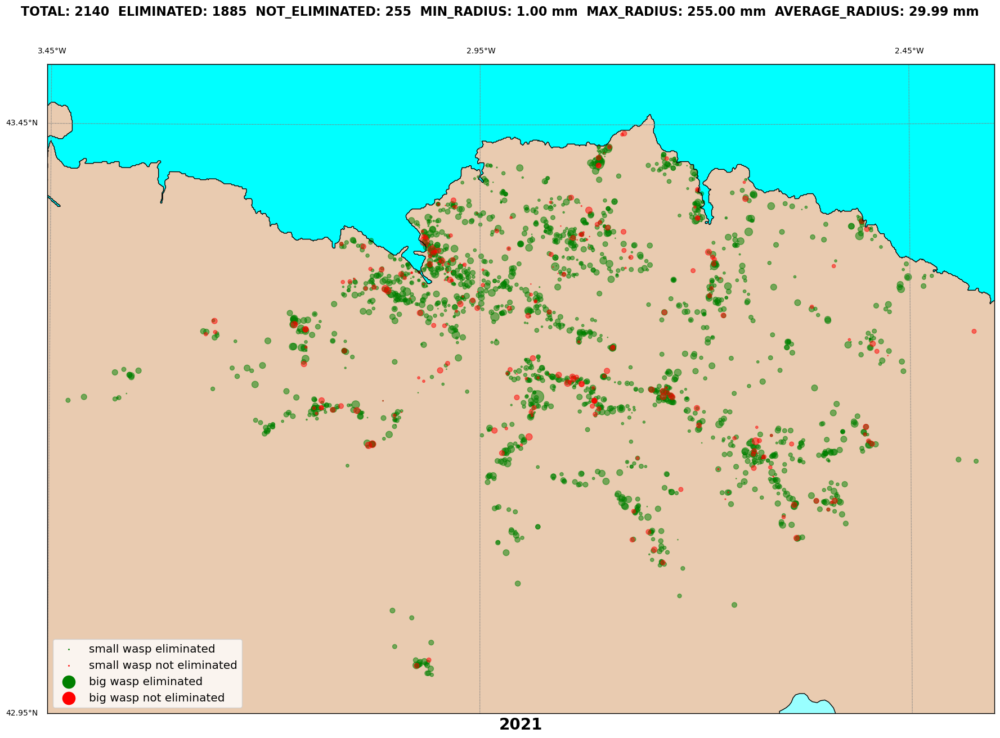

In [222]:
dibuja_mapa(longitud_2021_si, longitud_2021_no, latitud_2021_si, latitud_2021_no, diametro_2021_si, diametro_2021_no, x_min, x_max, y_min, y_max, '2021.png', '2021')

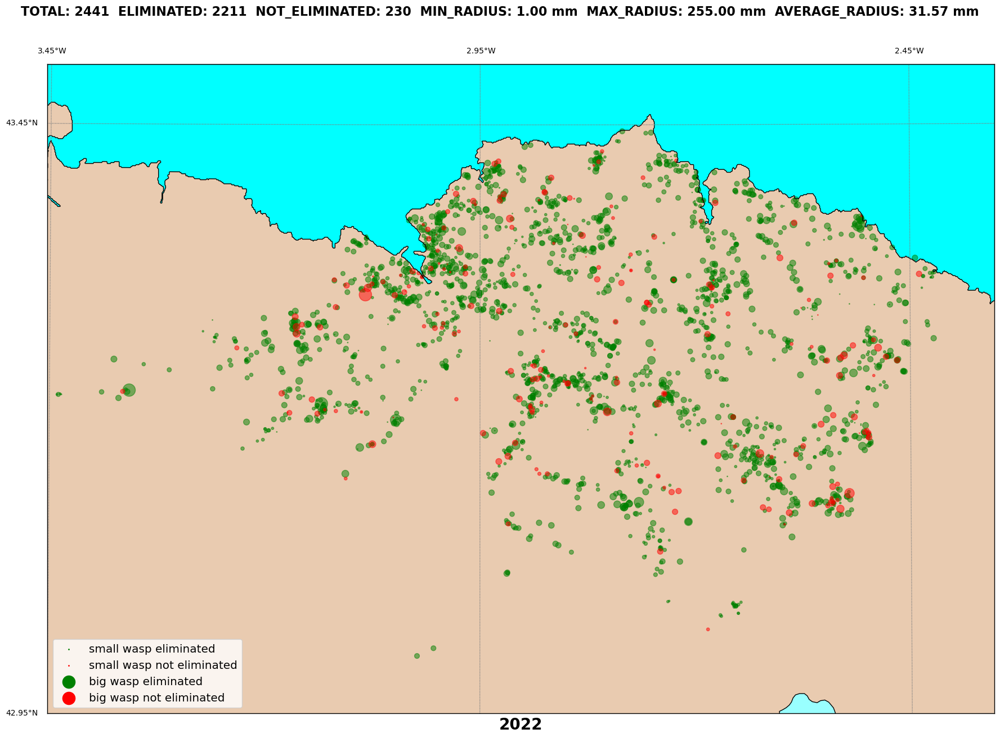

In [223]:
dibuja_mapa(longitud_2022_si, longitud_2022_no, latitud_2022_si, latitud_2022_no, diametro_2022_si, diametro_2022_no, x_min, x_max, y_min, y_max,'2022.png', '2022')

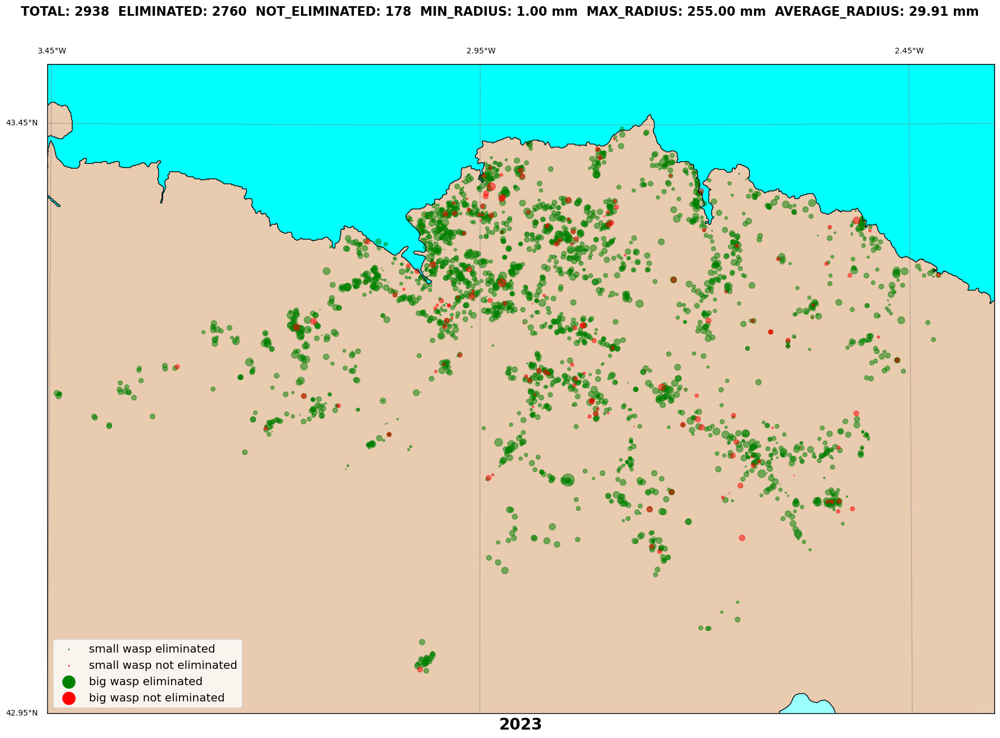

In [224]:
dibuja_mapa(longitud_2023_si, longitud_2023_no, latitud_2023_si, latitud_2023_no, diametro_2023_si, diametro_2023_no, x_min, x_max, y_min, y_max, '2023.png', '2023')

In [225]:
from moviepy.editor import ImageSequenceClip

image_folder = '/home/mac/Documentos/CienciaDeDades/Visualitzacio_de_dades/Tema3/PAC3/'

image_files = [
    
    f"{image_folder}/general.png",
    f"{image_folder}/2017.png",
    f"{image_folder}/2018.png",
    f"{image_folder}/2019.png",
    f"{image_folder}/2020.png",
    f"{image_folder}/2021.png",
    f"{image_folder}/2022.png",
    f"{image_folder}/2023.png"
]

clip = ImageSequenceClip(image_files, fps=0.3)

gif_file = image_folder + 'wasp_animation.gif'
clip.write_gif(gif_file, fps=10, program='ffmpeg')

print(f"GIF creado correctamente: {gif_file}")

MoviePy - Building file  /home/mac/Documentos/CienciaDeDades/Visualitzacio_de_dades/Tema3/PAC3/wasp_animation.gif
MoviePy - - Generating GIF frames.


MoviePy - - File ready: /home/mac/Documentos/CienciaDeDades/Visualitzacio_de_dades/Tema3/PAC3/wasp_animation.gif.
GIF creado correctamente: /home/mac/Documentos/CienciaDeDades/Visualitzacio_de_dades/Tema3/PAC3/wasp_animation.gif
